In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns

In [ ]:
ratings= pd.read_csv('pollster-ratings-combined.csv')
polls= pd.read_csv('raw_polls.csv')

In [ ]:
ratings.head()

,pollster,pollster_rating_id,aapor_roper,inactive,numeric_grade,rank,POLLSCORE,wtd_avg_transparency,number_polls_pollster_total,percent_partisan_work,error_ppm,bias_ppm,number_polls_pollster_time_weighted
0,The New York Times/Siena College,448,True,False,3.0,1.0,-1.5,8.7,120,0.0,-1.0,-2.0,111.6
1,ABC News/The Washington Post,3,True,False,3.0,2.0,-1.2,9.2,97,0.0,-1.0,-1.3,25.3
2,Marquette University Law School,195,True,False,3.0,3.0,-1.1,10.0,21,0.0,-1.0,-1.1,12.5
3,YouGov,391,False,False,3.0,4.0,-1.1,9.0,596,0.0,-0.4,-1.7,272.6
4,Monmouth University Polling Institute,215,True,False,2.9,5.0,-0.9,9.9,146,0.0,-0.7,-1.0,84.2


In [ ]:
polls.head()

,poll_id,question_id,race_id,cycle,location,type_simple,race,pollster,pollster_rating_id,aapor_roper,...,cand1_party,cand1_pct,cand1_actual,cand2_name,cand2_id,cand2_party,cand2_pct,cand2_actual,margin_poll,margin_actual
0,32945,39543,1,2014,NE,Sen-G,2014_Sen-G_NE,YouGov,391,False,...,DEM,31.0,31.485351,Ben Sasse,6269,REP,58.0,64.336886,-27.0,-32.851535
1,33777,40963,1,2014,NE,Sen-G,2014_Sen-G_NE,YouGov,391,False,...,DEM,30.0,31.485351,Ben Sasse,6269,REP,59.0,64.336886,-29.0,-32.851535
2,33068,126637,2,2014,MI,Sen-G,2014_Sen-G_MI,Public Policy Polling,263,False,...,DEM,43.0,54.614384,Terri Lynn Land,6052,REP,36.0,41.329073,7.0,13.285311
3,33061,39666,2,2014,MI,Sen-G,2014_Sen-G_MI,Suffolk University,323,True,...,DEM,45.6,54.614384,Terri Lynn Land,6052,REP,36.8,41.329073,8.8,13.285311
4,33037,39642,2,2014,MI,Sen-G,2014_Sen-G_MI,Denno Research,582,False,...,DEM,44.7,54.614384,Terri Lynn Land,6052,REP,37.7,41.329073,7.0,13.285311


In [ ]:
ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 540 entries, 0 to 539
Data columns (total 13 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   pollster                             540 non-null    object 
 1   pollster_rating_id                   540 non-null    int64  
 2   aapor_roper                          540 non-null    bool   
 3   inactive                             540 non-null    bool   
 4   numeric_grade                        282 non-null    float64
 5   rank                                 282 non-null    float64
 6   POLLSCORE                            540 non-null    float64
 7   wtd_avg_transparency                 540 non-null    float64
 8   number_polls_pollster_total          540 non-null    int64  
 9   percent_partisan_work                540 non-null    float64
 10  error_ppm                            540 non-null    float64
 11  bias_ppm                        

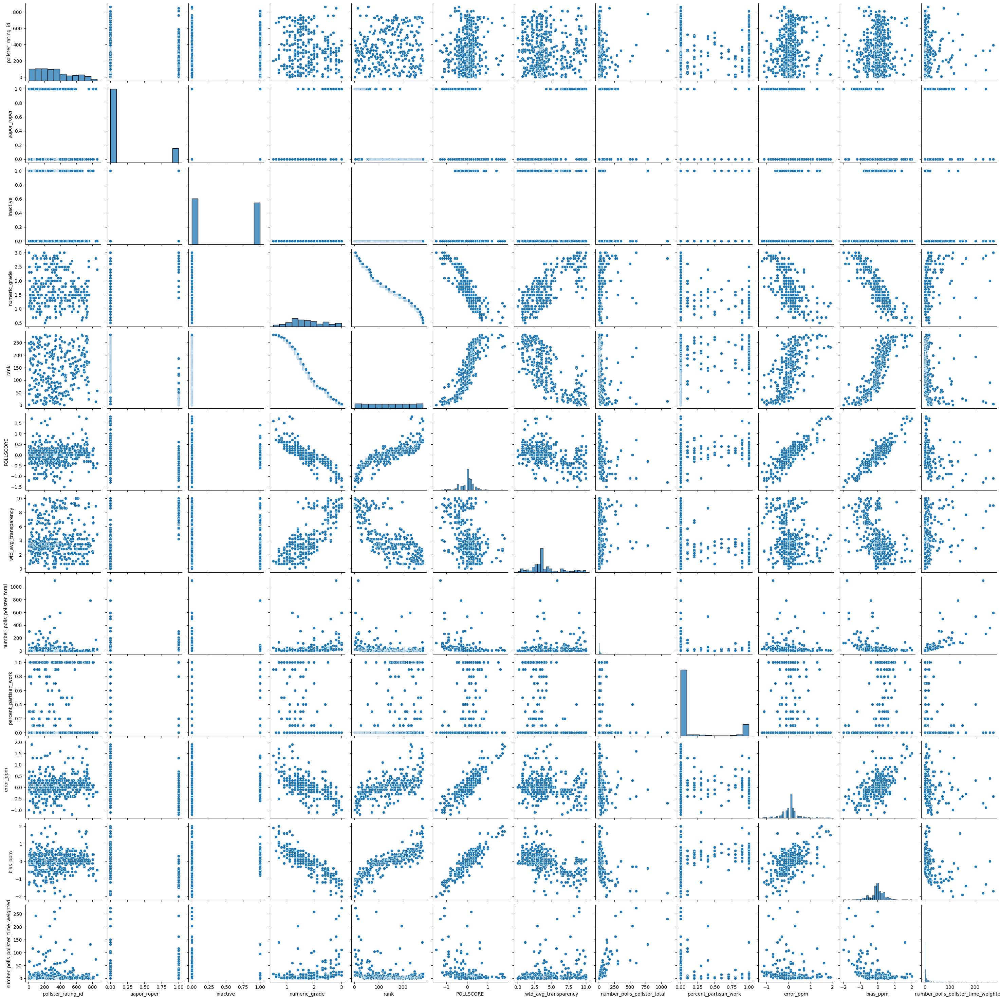

In [ ]:
sns.pairplot(ratings)

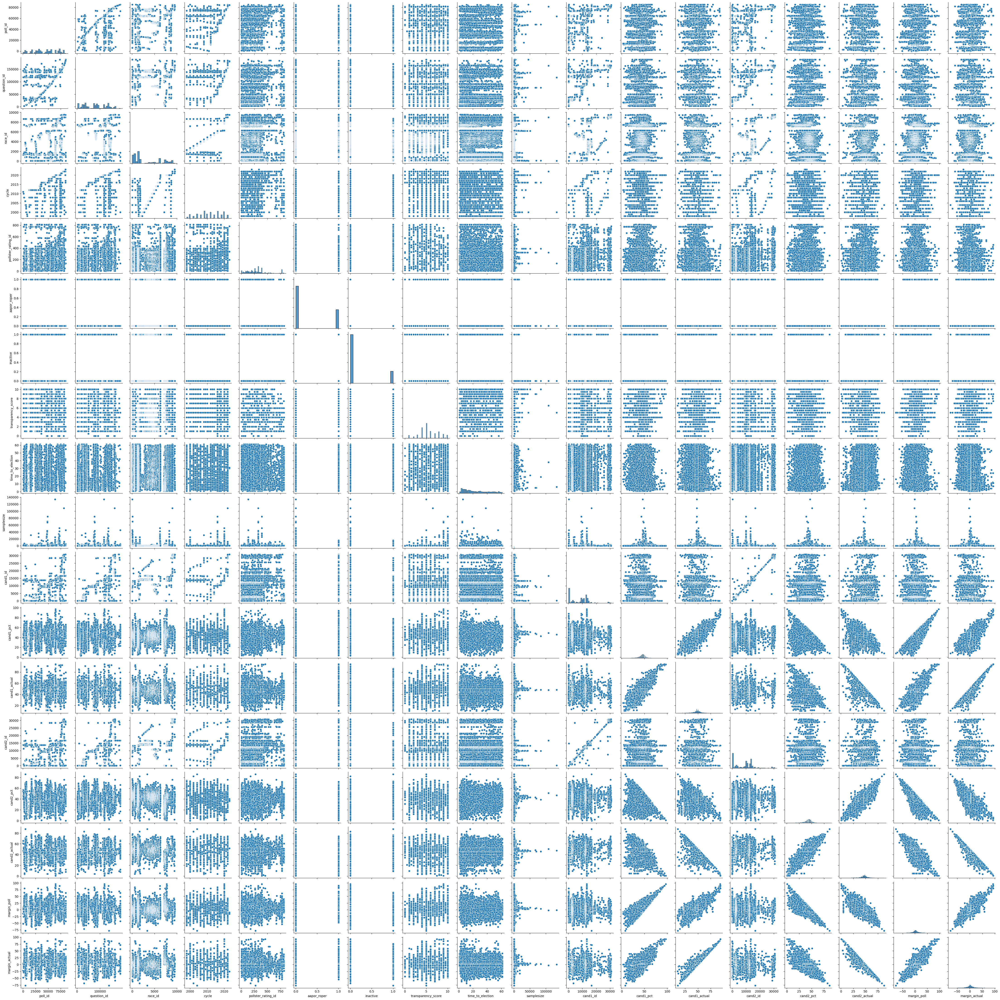

In [ ]:
sns.pairplot(polls)

<Axes: >

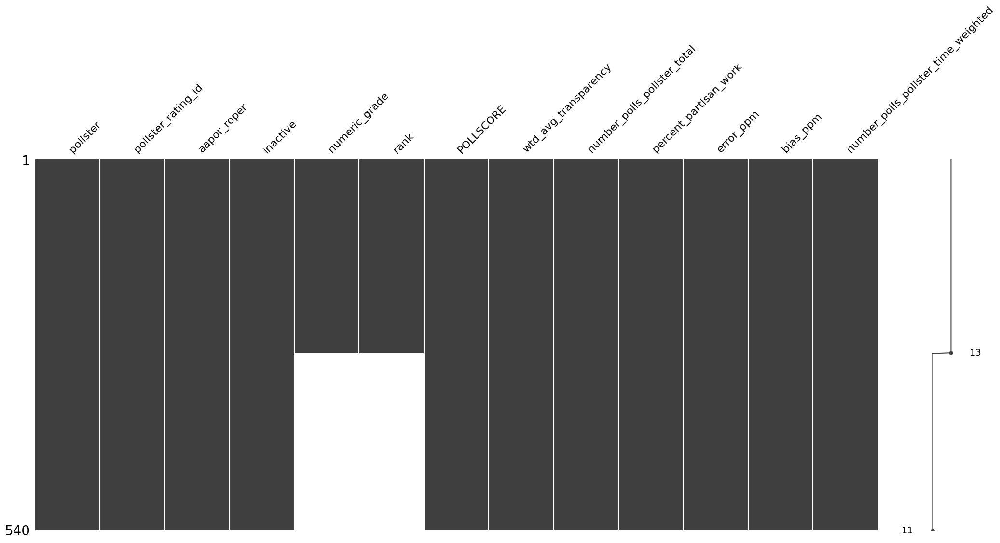

In [16]:
#check for na values
import missingno as msno

msno.matrix(ratings)

#NOTE THAT THE NUMERIC GRADE AND RANK FIELDS ARE MISSING IN APPROCXIMATELY HALF THE ROWS.  CONSIDER NOT USING THESE COLUMNS.

<Axes: >

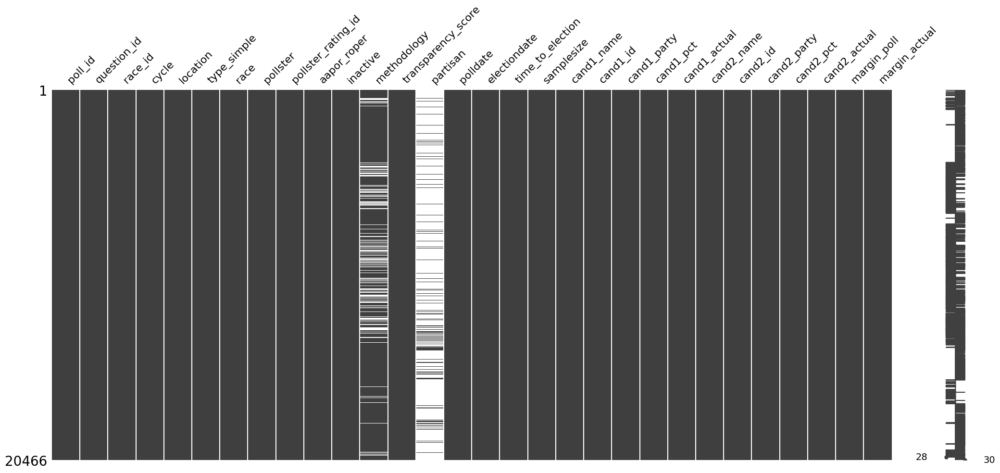

In [17]:
msno.matrix(polls)

  Note that the Partisan Column has many missing values.  The methodology column also contains quite a few missing values.  Neither of these columns are areas where it would be correct to impute.

In [ ]:
#check for outliar values

In [20]:
def find_outliers_iqr(df):
  if not isinstance(df, pd.DataFrame):
        return {}

  outliers = {}
  for col in df.select_dtypes(include=np.number): #only numeric columns
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    column_outliers = []
    for index, value in df[col].items():
      if value < lower_bound or value > upper_bound:
        column_outliers.append((value, index))

    if column_outliers:
        outliers[col] = column_outliers

    return outliers

In [22]:
find_outliers_iqr(ratings)

{}

In [23]:
find_outliers_iqr(polls)

{}

### No outliers in either data set, so ok to proceed with visualization of data as is, keeping in mind the nulls mentioned previously.